<a href="https://colab.research.google.com/github/Nikhil5566/Data-Science-Portfolio-Projects/blob/main/Vehicle%20Specs%20%26%20Carbon%20Footprint%20(2015-2026).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Vehicle Specs & Carbon Footprint (2015-2026)

## Understanding Dataset and Key-Insights

The dataset you've been working with, titled 'Vehicle Specs & Carbon Footprint (2015-2026)', provides a comprehensive look into a wide range of vehicles, from traditional gasoline cars to electric vehicles, across various years. It contains crucial details such as the vehicle's make, model, year of manufacture, fuel type, engine specifications (cylinders and size), drivetrain, and, most importantly, its fuel efficiency metrics like City, Highway, and Combined Miles Per Gallon (MPG), along with its CO2 emissions in grams per mile and electric vehicle range in miles. We also have a Vehicle_Category column that broadly classifies vehicles as ICE (Gas), EV, ICE (Diesel), Hybrid/Other, or CNG.

From our initial exploration and in-depth analysis, several key insights have emerged:

1. The Shifting Landscape of Vehicle Technology: Our time-series analysis clearly shows a positive trend towards environmental sustainability. Over the years from 2015 to 2026, there's a noticeable decrease in average CO2 emissions, alongside a significant increase in the average electric vehicle (EV) range. This highlights the industry's progression towards more efficient and less polluting vehicle options, especially with the rise of EVs.

2. Fuel Efficiency is Key to Lower Emissions: As expected, there's a strong inverse relationship between a vehicle's fuel efficiency (Combined MPG) and its CO2 emissions. Vehicles that achieve higher MPG tend to have considerably lower CO2 emissions. This was quantitatively confirmed by our linear regression model, which showed that Combined MPG is a very strong predictor of CO2 emissions, accounting for about 80% of the variance in emissions.

3. Vehicle Categories Matter for Emissions: Our ANOVA test revealed a statistically significant difference in CO2 emissions across different vehicle categories. This means that not all vehicle types contribute equally to carbon emissions. Further investigation with a T-test specifically comparing ICE (Gas) vehicles with Electric Vehicles (EVs) confirmed a profound difference: EVs inherently produce almost zero direct CO2 emissions, making them dramatically cleaner than their gasoline counterparts.

4. Engine Characteristics Impact Emissions: The correlation matrix highlighted that larger engine sizes and a higher number of engine cylinders are generally associated with lower fuel efficiency and, consequently, higher CO2 emissions. This reinforces the understanding that powerful, larger engines typically come with a greater environmental footprint.

5. Predictability of CO2 Emissions: Our machine learning models demonstrated a high capability to predict CO2 emissions. The Random Forest model, in particular, achieved an impressive R-squared value of 0.9985, meaning it can explain nearly all the variability in CO2 emissions based on the provided features. The most important features for this prediction were primarily the various MPG metrics (Combined, Highway, City MPG), further emphasizing their direct link to carbon output.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d iconicwasil/vehicle-specs-and-carbon-footprint-2015-2026

# Unziping the downloaded file
!unzip vehicle-specs-and-carbon-footprint-2015-2026.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/iconicwasil/vehicle-specs-and-carbon-footprint-2015-2026
License(s): CC0-1.0
100% 196k/196k [00:00<00:00, 100MB/s]

Archive:  vehicle-specs-and-carbon-footprint-2015-2026.zip
  inflating: EV_vs_ICE_Vehicle_Specs_2015_2026.csv  


In [4]:
df = pd.read_csv('EV_vs_ICE_Vehicle_Specs_2015_2026.csv')
df.head(11)

,Make,Model,Year,Fuel_Type,Engine_Cylinders,Engine_Size_L,Drivetrain,Transmission,City_MPG,Highway_MPG,Combined_MPG,CO2_Emissions_g_per_mile,EV_Range_miles,Vehicle_Category
0,Nissan,GT-R,2015,Premium Gasoline,6.0,3.8,All-Wheel Drive,Automatic (AM6),16,23,19,472,0,ICE (Gas)
1,Volvo,S60 AWD,2015,Regular Gasoline,5.0,2.5,All-Wheel Drive,Automatic (S6),20,28,23,378,0,ICE (Gas)
2,Mazda,6,2015,Regular Gasoline,4.0,2.5,Front-Wheel Drive,Automatic (S6),26,37,30,298,0,ICE (Gas)
3,Mazda,6,2015,Regular Gasoline,4.0,2.5,Front-Wheel Drive,Automatic (S6),28,39,32,280,0,ICE (Gas)
4,Mazda,6,2015,Regular Gasoline,4.0,2.5,Front-Wheel Drive,Manual 6-spd,25,35,29,308,0,ICE (Gas)
5,Kia,K900,2015,Regular Gasoline,6.0,3.8,Rear-Wheel Drive,Automatic 8-spd,18,26,21,428,0,ICE (Gas)
6,Kia,K900,2015,Premium Gasoline,8.0,5.0,Rear-Wheel Drive,Automatic 8-spd,15,23,18,494,0,ICE (Gas)
7,Kia,Sorento FWD,2015,Regular Gasoline,6.0,3.3,Front-Wheel Drive,Automatic 6-spd,18,25,21,427,0,ICE (Gas)
8,Mazda,CX-5 2WD,2015,Regular Gasoline,4.0,2.0,Front-Wheel Drive,Automatic (S6),26,32,28,311,0,ICE (Gas)
9,Mazda,CX-5 2WD,2015,Regular Gasoline,4.0,2.0,Front-Wheel Drive,Manual 6-spd,26,34,29,306,0,ICE (Gas)


In [5]:
df.tail(11)

,Make,Model,Year,Fuel_Type,Engine_Cylinders,Engine_Size_L,Drivetrain,Transmission,City_MPG,Highway_MPG,Combined_MPG,CO2_Emissions_g_per_mile,EV_Range_miles,Vehicle_Category
15290,Subaru,Uncharted,2026,Electricity,0.0,0.0,Front-Wheel Drive,Automatic (A1),140,118,129,0,308,EV
15291,Subaru,Uncharted 20 inch AWD,2026,Electricity,0.0,0.0,All-Wheel Drive,Automatic (A1),123,101,112,0,273,EV
15292,Subaru,Uncharted AWD,2026,Electricity,0.0,0.0,All-Wheel Drive,Automatic (A1),127,106,117,0,287,EV
15293,Tesla,Model Y Standard AWD,2026,Electricity,0.0,0.0,All-Wheel Drive,Automatic (A1),133,120,127,0,294,EV
15294,Toyota,bZ Woodland AWD 235/60R18,2026,Electricity,0.0,0.0,All-Wheel Drive,Automatic (A1),127,107,117,0,281,EV
15295,Toyota,bZ Woodland AWD 235/65R18,2026,Electricity,0.0,0.0,All-Wheel Drive,Automatic (A1),117,100,109,0,260,EV
15296,Toyota,C-HR AWD 18inch,2026,Electricity,0.0,0.0,All-Wheel Drive,Automatic (A1),127,107,117,0,287,EV
15297,Toyota,C-HR AWD 20inch,2026,Electricity,0.0,0.0,All-Wheel Drive,Automatic (A1),122,102,112,0,273,EV
15298,Aston Martin,Valhalla,2026,Premium Gasoline,8.0,4.0,All-Wheel Drive,Automatic 8-spd,14,19,16,486,280,ICE (Gas)
15299,Mitsubishi,Outlander PHEV,2026,Regular Gasoline,4.0,2.4,All-Wheel Drive,Automatic (A1),27,27,27,97,420,ICE (Gas)


In [6]:
df.shape

(15301, 14)

In [7]:
df.columns

Index(['Make', 'Model', 'Year', 'Fuel_Type', 'Engine_Cylinders',
       'Engine_Size_L', 'Drivetrain', 'Transmission', 'City_MPG',
       'Highway_MPG', 'Combined_MPG', 'CO2_Emissions_g_per_mile',
       'EV_Range_miles', 'Vehicle_Category'],
      dtype='object')

In [8]:
df.dtypes

,0
Make,object
Model,object
Year,int64
Fuel_Type,object
Engine_Cylinders,float64
Engine_Size_L,float64
Drivetrain,object
Transmission,object
City_MPG,int64
Highway_MPG,int64


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15301 entries, 0 to 15300
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Make                      15301 non-null  object 
 1   Model                     15301 non-null  object 
 2   Year                      15301 non-null  int64  
 3   Fuel_Type                 15300 non-null  object 
 4   Engine_Cylinders          15301 non-null  float64
 5   Engine_Size_L             15301 non-null  float64
 6   Drivetrain                15301 non-null  object 
 7   Transmission              15301 non-null  object 
 8   City_MPG                  15301 non-null  int64  
 9   Highway_MPG               15301 non-null  int64  
 10  Combined_MPG              15301 non-null  int64  
 11  CO2_Emissions_g_per_mile  15301 non-null  int64  
 12  EV_Range_miles            15301 non-null  int64  
 13  Vehicle_Category          15301 non-null  object 
dtypes: flo

In [11]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Make,15301,63,BMW,1275,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Model,15301,3079,Camaro,76,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Year,15301.0,NaN,NaN,NaN,2020.474348,3.407711,2015.0,2018.0,2020.0,2023.0,2026.0
Fuel_Type,15300,7,Premium Gasoline,7020,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Engine_Cylinders,15301.0,NaN,NaN,NaN,5.041566,2.378575,0.0,4.0,4.0,6.0,16.0
Engine_Size_L,15301.0,NaN,NaN,NaN,2.802464,1.528925,0.0,2.0,2.5,3.6,8.4
Drivetrain,15301,5,All-Wheel Drive,5307,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Transmission,15301,34,Automatic (S8),3239,NaN,NaN,NaN,NaN,NaN,NaN,NaN
City_MPG,15301.0,NaN,NaN,NaN,28.005163,23.870583,8.0,17.0,21.0,25.0,153.0
Highway_MPG,15301.0,NaN,NaN,NaN,32.99085,19.191434,11.0,23.0,28.0,33.0,142.0


In [12]:
df.isnull().sum()

,0
Make,0
Model,0
Year,0
Fuel_Type,1
Engine_Cylinders,0
Engine_Size_L,0
Drivetrain,0
Transmission,0
City_MPG,0
Highway_MPG,0


In [13]:
df.duplicated().sum()

np.int64(0)

# Univariate Analysis

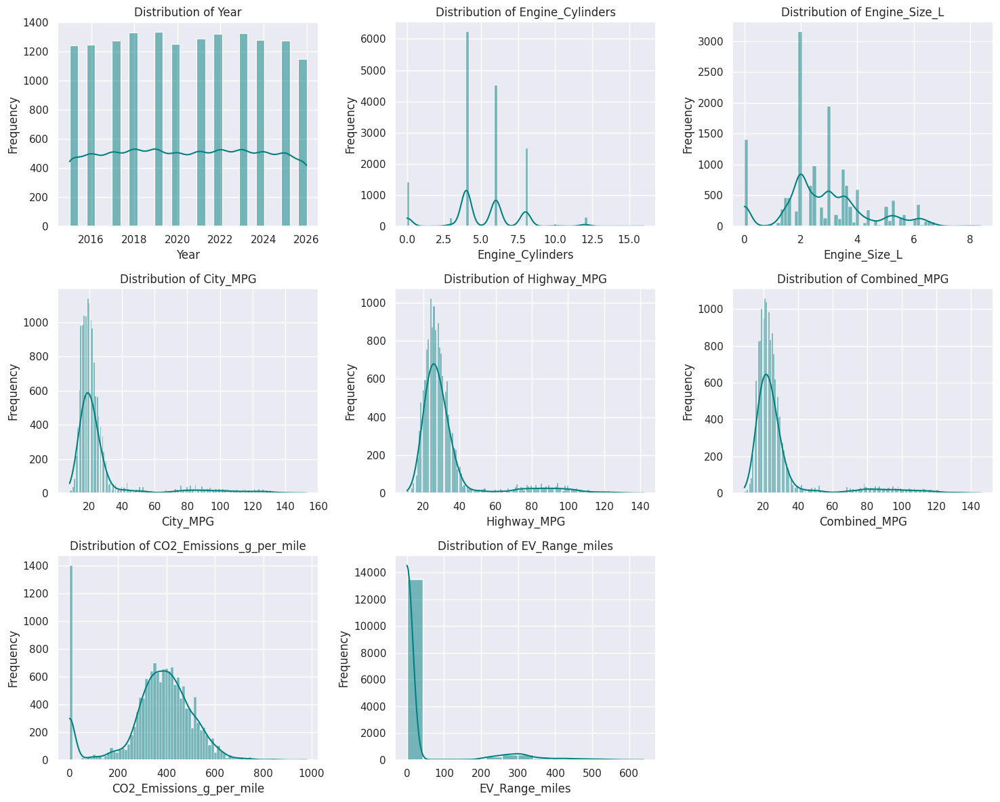

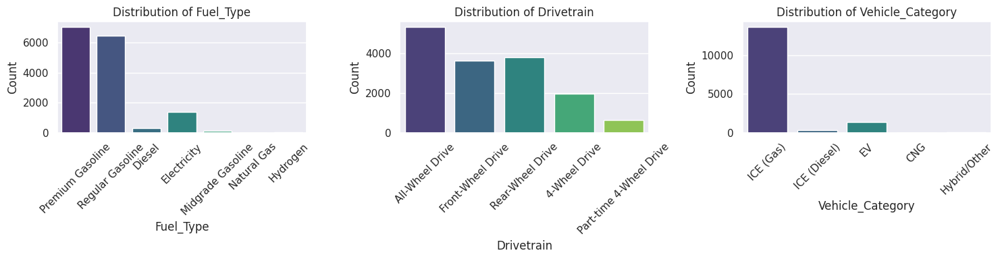

--- Categorical Value Counts ---

Value counts for Fuel_Type:
Fuel_Type
Premium Gasoline     7020
Regular Gasoline     6443
Electricity          1361
Diesel                308
Midgrade Gasoline     126
Hydrogen               41
Natural Gas             1
Name: count, dtype: int64

Value counts for Drivetrain:
Drivetrain
All-Wheel Drive            5307
Rear-Wheel Drive           3772
Front-Wheel Drive          3627
4-Wheel Drive              1972
Part-time 4-Wheel Drive     623
Name: count, dtype: int64

Value counts for Vehicle_Category:
Vehicle_Category
ICE (Gas)       13589
EV               1361
ICE (Diesel)      308
Hybrid/Other       42
CNG                 1
Name: count, dtype: int64


In [14]:
import math

# --- 1. Numerical Columns (Histograms in a Grid) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

if len(numerical_cols) > 0:
    # Defining grid size
    num_plots = len(numerical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterating and plot
    for i, col in enumerate(numerical_cols):
        sns.histplot(data=df, x=col, kde=True, ax=axes[i], color='teal') # Added color
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')

    # Hiding any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No numerical columns found.")


# --- 2. Categorical Columns (Countplots in a Grid) ---
# Filtering out columns with too many unique values (like IDs) to avoid messy plots
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]

if len(categorical_cols) > 0:
    # Defining grid size
    num_plots = len(categorical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterating and plot
    for i, col in enumerate(categorical_cols):
        sns.countplot(data=df, x=col, ax=axes[i], palette='viridis', hue=col, legend=False) # Added palette
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Count')
        axes[i].tick_params(axis='x', rotation=45)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

     # --- 3. Value Counts (Text Output) ---
    print("--- Categorical Value Counts ---")
    for col in categorical_cols:
        print(f"\nValue counts for {col}:")
        print(df[col].value_counts())
else:
    print("No categorical columns found (or all have high cardinality).")

# Bivariate Analysis

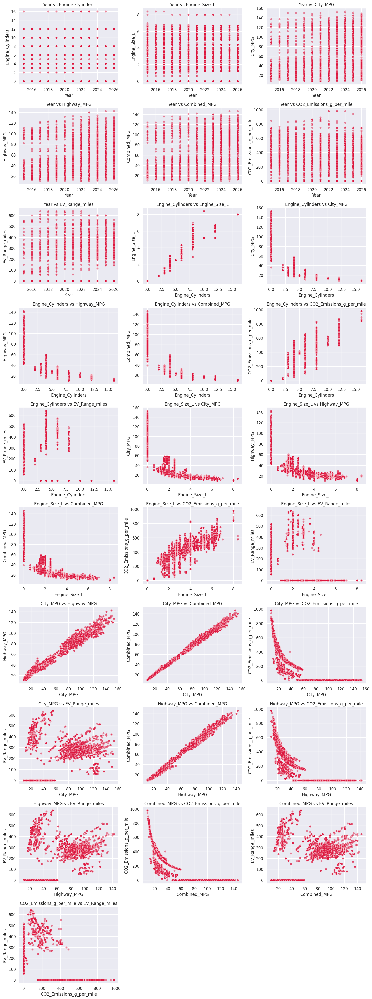

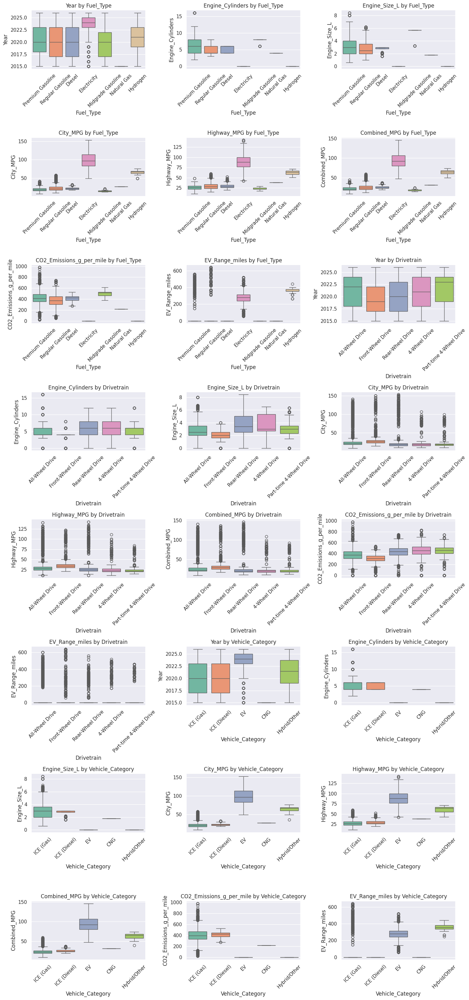

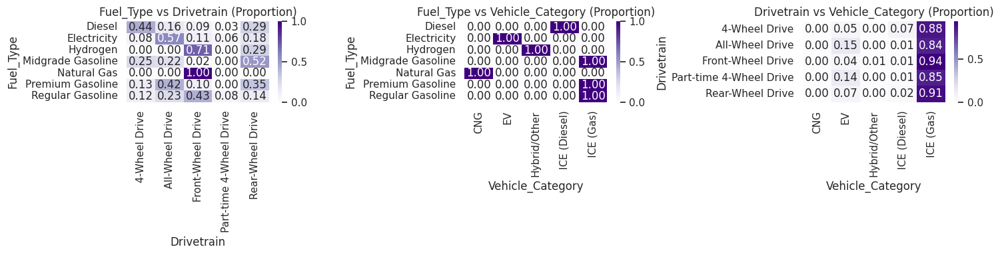

In [15]:
import itertools

# --- 1. Numerical-Numerical Relationships (Scatter Plots) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all unique pairs of numerical columns
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(num_pairs) > 0:
    # Defining grid size
    num_plots = len(num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (col1, col2) in enumerate(num_pairs):
        sns.scatterplot(data=df, x=col1, y=col2, ax=axes[i], alpha=0.5, color='crimson') # Added color
        axes[i].set_title(f'{col1} vs {col2}')
        axes[i].set_xlabel(col1)
        axes[i].set_ylabel(col2)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Not enough numerical columns for scatter plots.")


# --- 2. Categorical-Numerical Relationships (Box Plots) ---
# Excluding high cardinality columns
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all pairs of (Categorical, Numerical)
cat_num_pairs = list(itertools.product(categorical_cols, numerical_cols))

if len(cat_num_pairs) > 0:
    # Defining grid size
    num_plots = len(cat_num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (cat_col, num_col) in enumerate(cat_num_pairs):
        sns.boxplot(data=df, x=cat_col, y=num_col, ax=axes[i], palette='Set2', hue=cat_col, legend=False)
        axes[i].set_title(f'{num_col} by {cat_col}')
        axes[i].set_xlabel(cat_col)
        axes[i].set_ylabel(num_col)
        axes[i].tick_params(axis='x', rotation=45)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No categorical-numerical pairs found.")


# --- 3. Categorical-Categorical Relationships (Heatmaps) ---
# Generating pairs of categorical columns
cat_pairs = list(itertools.combinations(categorical_cols, 2))

if len(cat_pairs) > 0:
    num_plots = len(cat_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for i, (col1, col2) in enumerate(cat_pairs):
        # Creating a cross-tabulation
        crosstab = pd.crosstab(df[col1], df[col2], normalize='index')
        sns.heatmap(crosstab, annot=True, fmt='.2f', cmap='Purples', ax=axes[i])
        axes[i].set_title(f'{col1} vs {col2} (Proportion)')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Multivariate Analysis


Analyzing relationships with Hue: Fuel_Type...


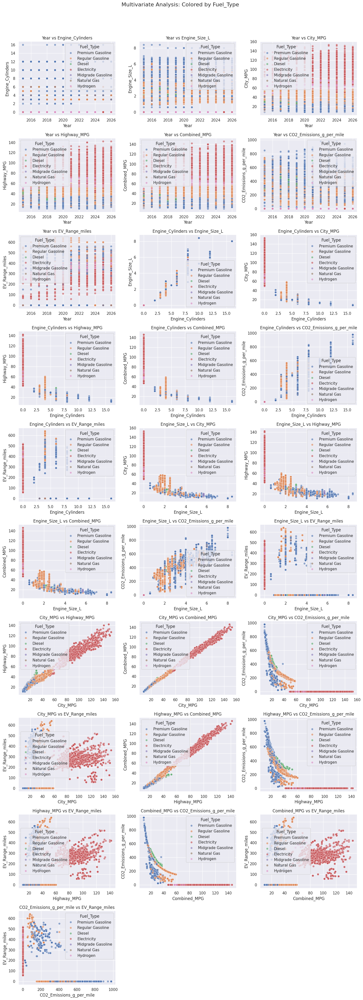


Analyzing relationships with Hue: Drivetrain...


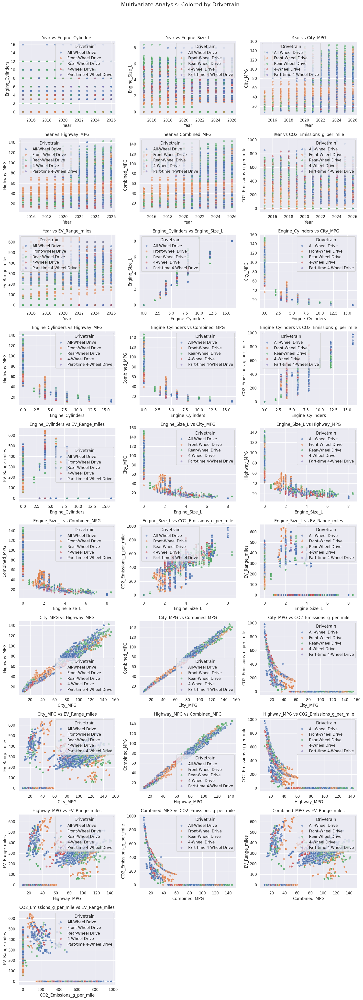


Analyzing relationships with Hue: Vehicle_Category...


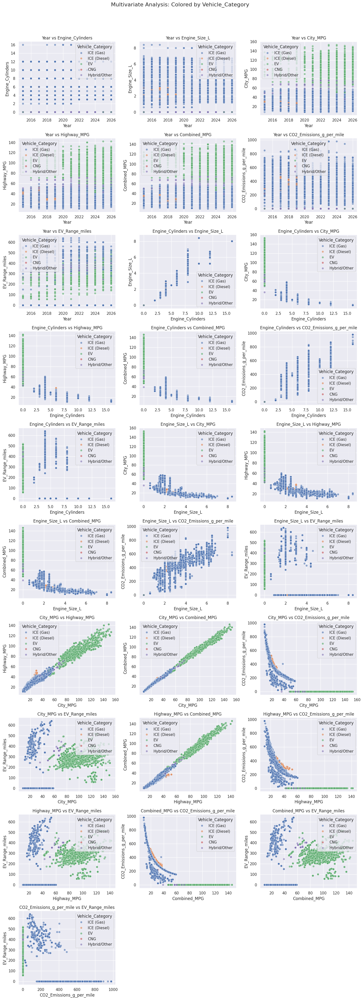

In [16]:
import itertools
import math

# --- Multivariate Analysis: Numerical Pairs with Categorical Hue ---

# 1. Identifying valid columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()
# Filtering categorical columns to those with few unique values for clear legends (e.g., < 10)
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 10]

# Generating pairs of numerical columns to plot
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(numerical_cols) > 1 and len(categorical_cols) > 0:
    # OUTER LOOP: Iterating through each categorical variable to use as the 'Hue'
    for cat_col in categorical_cols:
        print(f"\nAnalyzing relationships with Hue: {cat_col}...")

        # Defining grid size for the inner loop (numerical pairs)
        num_plots = len(num_pairs)
        num_cols_plot = 3
        num_rows_plot = math.ceil(num_plots / num_cols_plot)

        # Creating figure
        fig, axes = plt.subplots(num_rows_plot, num_cols_plot, figsize=(15, 4 * num_rows_plot))
        if num_plots > 1:
             axes = axes.flatten()
        else:
             axes = [axes]

        # INNER LOOP: Iterating through numerical pairs
        for i, (num1, num2) in enumerate(num_pairs):
            sns.scatterplot(data=df, x=num1, y=num2, hue=cat_col, ax=axes[i], alpha=0.6)
            axes[i].set_title(f'{num1} vs {num2}')

        # Hiding unused subplots
        for j in range(i + 1, len(axes)):
            axes[j].axis('off')

        plt.suptitle(f'Multivariate Analysis: Colored by {cat_col}', y=1.02, fontsize=16)
        plt.tight_layout()
        plt.show()
        print("="*80)
else:
    print("Not enough data for multivariate scatter analysis (need >1 numerical and >0 categorical columns).")

# Pairplot

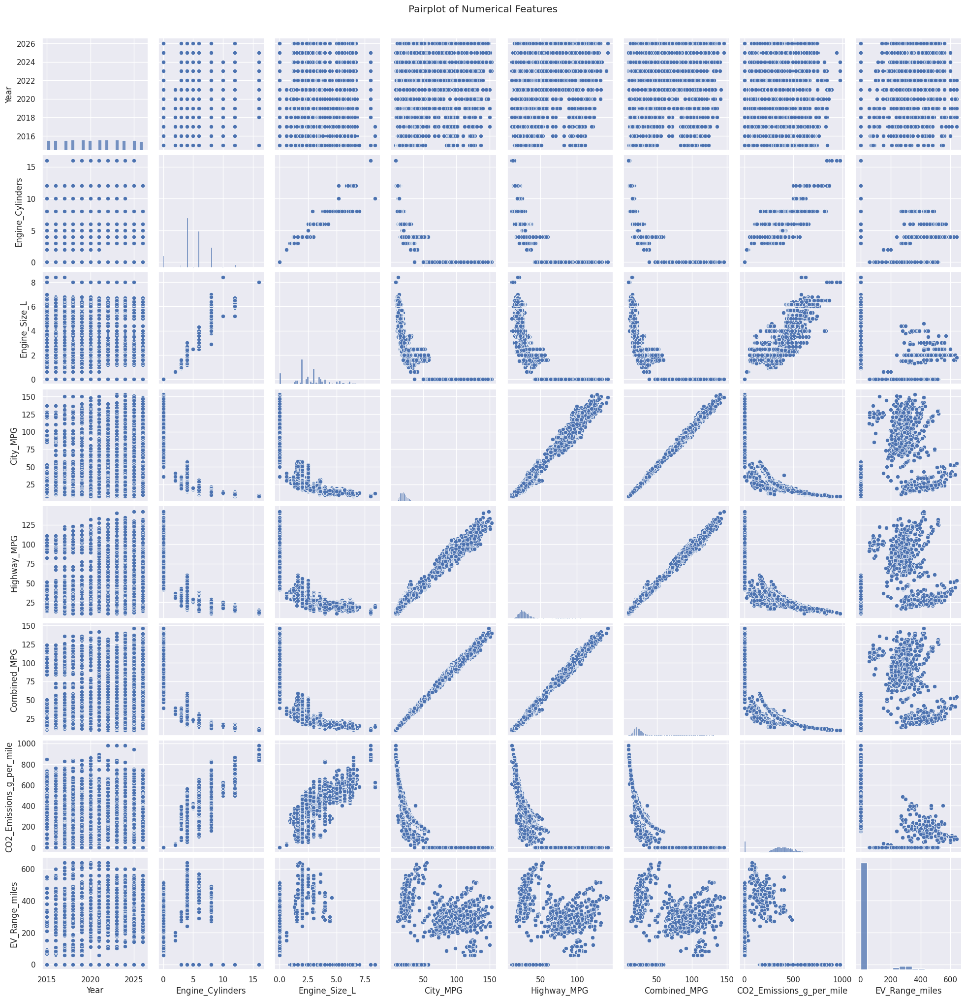

In [17]:
sns.pairplot(df.select_dtypes(include = np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

# Heatmap

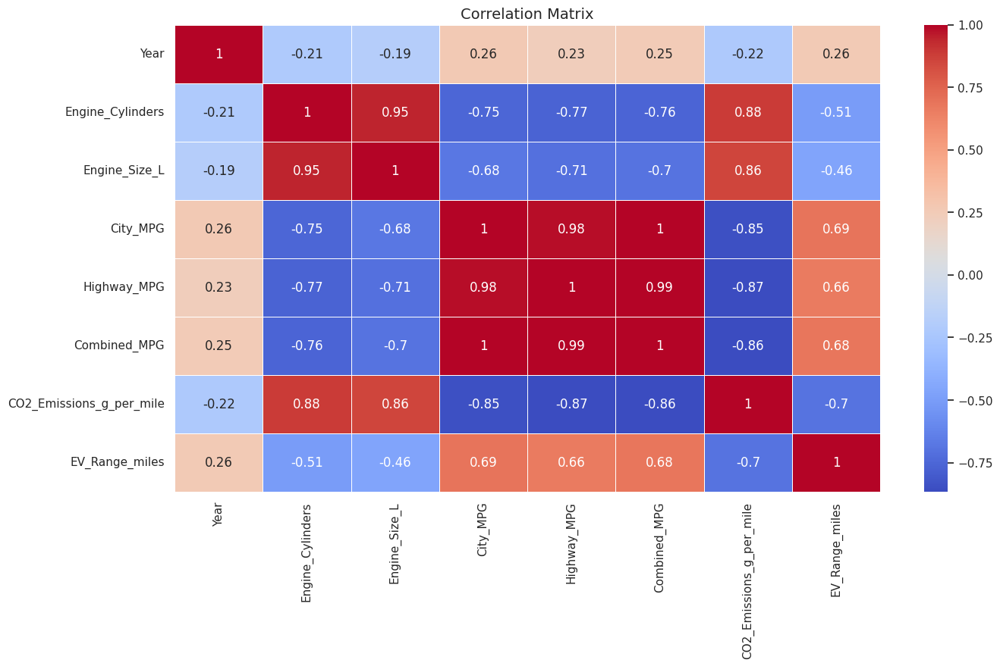

In [18]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Statistical Analysis

--- Time Series Analysis ---


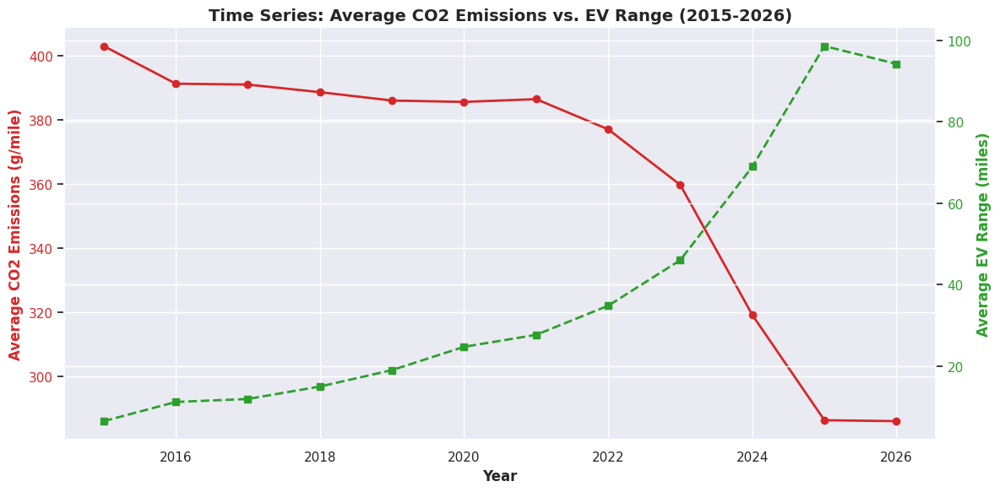


--- Correlation Analysis ---


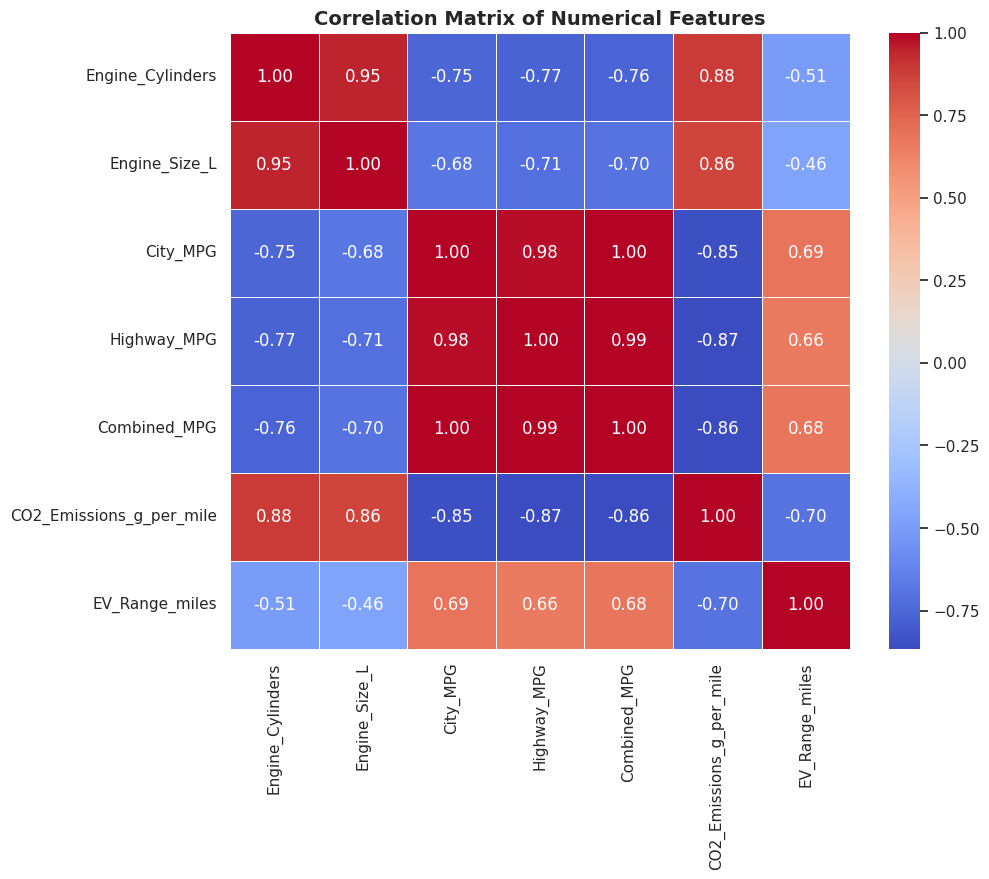


--- ANOVA Testing ---
F-Statistic: 4985.61
P-Value: 0.0000e+00
Conclusion: Reject the null hypothesis. There is a statistically significant difference in CO2 emissions across different vehicle categories.


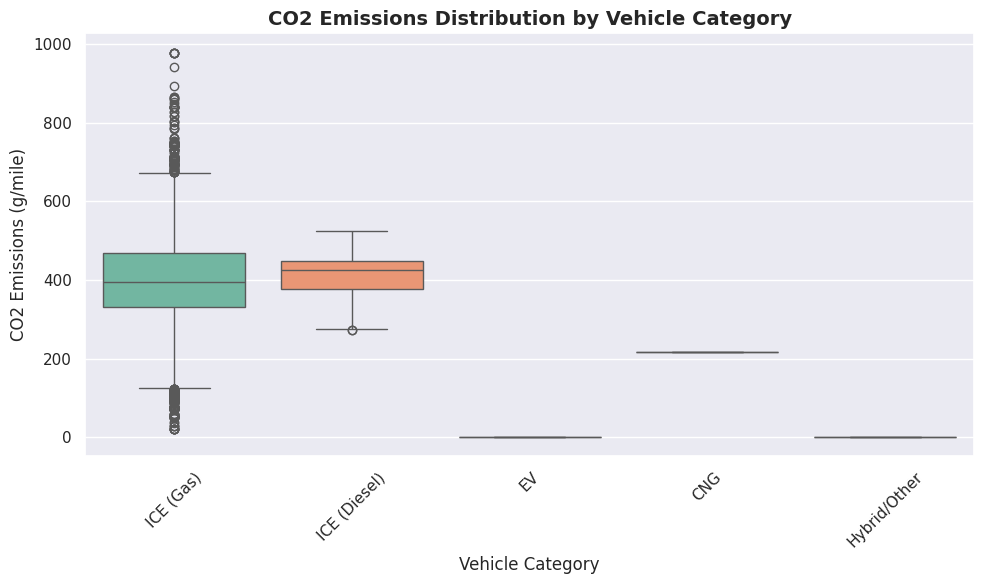


--- T-Test (ICE Gas vs EV CO2 Emissions) ---
T-Statistic: 436.04
P-Value: 0.0000e+00
Conclusion: Reject the null hypothesis. There is a statistically significant difference in CO2 emissions between ICE (Gas) and EV vehicles.

--- Regression Analysis (CO2 Emissions vs Combined MPG) ---
Intercept: 746.54
Coefficient for Combined_MPG: -14.78
Mean Squared Error (MSE): 2137.92
R-squared (R2): 0.80


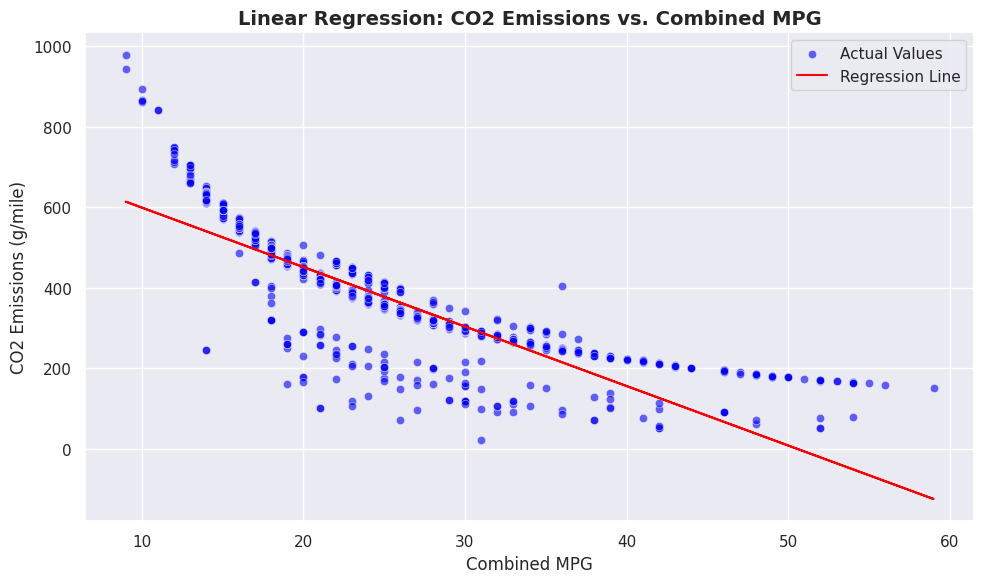

In [21]:
from scipy import stats
from scipy.stats import ttest_ind
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# ---------------------------------------------------------
# 1. TIME SERIES ANALYSIS
# ---------------------------------------------------------
print("--- Time Series Analysis ---")
# Group by Year to see the trend of CO2 Emissions and EV Range
yearly_trends = df.groupby('Year')[['CO2_Emissions_g_per_mile', 'EV_Range_miles', 'Combined_MPG']].mean().reset_index()

fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot CO2 Emissions on primary y-axis
color = 'tab:red'
ax1.set_xlabel('Year', fontweight='bold')
ax1.set_ylabel('Average CO2 Emissions (g/mile)', color=color, fontweight='bold')
ax1.plot(yearly_trends['Year'], yearly_trends['CO2_Emissions_g_per_mile'], color=color, marker='o', linewidth=2, label='CO2 Emissions')
ax1.tick_params(axis='y', labelcolor=color)

# Instantiate a second y-axis that shares the same x-axis for EV Range
ax2 = ax1.twinx()
color = 'tab:green'
ax2.set_ylabel('Average EV Range (miles)', color=color, fontweight='bold')
ax2.plot(yearly_trends['Year'], yearly_trends['EV_Range_miles'], color=color, marker='s', linewidth=2, linestyle='--', label='EV Range')
ax2.tick_params(axis='y', labelcolor=color)

plt.title('Time Series: Average CO2 Emissions vs. EV Range (2015-2026)', fontsize=14, fontweight='bold')
fig.tight_layout()
plt.show()

# ---------------------------------------------------------
# 2. ADVANCED STATISTICAL ANALYSIS: CORRELATION MATRIX
# ---------------------------------------------------------
print("\n--- Correlation Analysis ---")
# Select only numerical columns for correlation
numerical_cols = ['Engine_Cylinders', 'Engine_Size_L', 'City_MPG', 'Highway_MPG', 'Combined_MPG', 'CO2_Emissions_g_per_mile', 'EV_Range_miles']
corr_matrix = df[numerical_cols].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix of Numerical Features', fontsize=14, fontweight='bold')
plt.show()

# ---------------------------------------------------------
# 3. HYPOTHESIS TESTING: ANOVA
# ---------------------------------------------------------
print("\n--- ANOVA Testing ---")
# Question: Is there a statistically significant difference in CO2 Emissions between Vehicle Categories?

# Drop any potential NaN values in the relevant columns
df_clean = df.dropna(subset=['CO2_Emissions_g_per_mile', 'Vehicle_Category'])

# Extract groups
categories = df_clean['Vehicle_Category'].unique()
groups = [df_clean[df_clean['Vehicle_Category'] == cat]['CO2_Emissions_g_per_mile'] for cat in categories]

# Perform One-Way ANOVA
f_stat, p_value = stats.f_oneway(*groups)

print(f"F-Statistic: {f_stat:.2f}")
print(f"P-Value: {p_value:.4e}")

if p_value < 0.05:
    print("Conclusion: Reject the null hypothesis. There is a statistically significant difference in CO2 emissions across different vehicle categories.")
else:
    print("Conclusion: Fail to reject the null hypothesis. No significant difference in CO2 emissions across vehicle categories.")

# Visualize the distribution
plt.figure(figsize=(10, 6))
sns.boxplot(x='Vehicle_Category', y='CO2_Emissions_g_per_mile', data=df_clean, palette='Set2')
plt.title('CO2 Emissions Distribution by Vehicle Category', fontsize=14, fontweight='bold')
plt.xlabel('Vehicle Category')
plt.ylabel('CO2 Emissions (g/mile)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# ---------------------------------------------------------
# 4. HYPOTHESIS TESTING: T-TEST (Example: ICE Gas vs EV CO2 Emissions)
# ---------------------------------------------------------
print("\n--- T-Test (ICE Gas vs EV CO2 Emissions) ---")

ice_gas_emissions = df_clean[df_clean['Vehicle_Category'] == 'ICE (Gas)']['CO2_Emissions_g_per_mile']
ev_emissions = df_clean[df_clean['Vehicle_Category'] == 'EV']['CO2_Emissions_g_per_mile']

# Perform independent samples t-test
t_stat, p_value_ttest = ttest_ind(ice_gas_emissions, ev_emissions, equal_var=False) # Assuming unequal variances

print(f"T-Statistic: {t_stat:.2f}")
print(f"P-Value: {p_value_ttest:.4e}")

if p_value_ttest < 0.05:
    print("Conclusion: Reject the null hypothesis. There is a statistically significant difference in CO2 emissions between ICE (Gas) and EV vehicles.")
else:
    print("Conclusion: Fail to reject the null hypothesis. No significant difference in CO2 emissions between ICE (Gas) and EV vehicles.")

# ---------------------------------------------------------
# 5. REGRESSION ANALYSIS (Predicting CO2 Emissions from Combined MPG)
# ---------------------------------------------------------
print("\n--- Regression Analysis (CO2 Emissions vs Combined MPG) ---")

# Filter out rows with 0 Combined_MPG or CO2_Emissions_g_per_mile if they are not meaningful for regression
df_reg = df[(df['Combined_MPG'] > 0) & (df['CO2_Emissions_g_per_mile'] > 0)].copy()

X = df_reg[['Combined_MPG']]
y = df_reg['CO2_Emissions_g_per_mile']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize and train the model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Intercept: {model.intercept_:.2f}")
print(f"Coefficient for Combined_MPG: {model.coef_[0]:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R-squared (R2): {r2:.2f}")

# Visualize the regression
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_test['Combined_MPG'], y=y_test, alpha=0.6, label='Actual Values', color='blue')
plt.plot(X_test['Combined_MPG'], y_pred, color='red', label='Regression Line')
plt.title('Linear Regression: CO2 Emissions vs. Combined MPG', fontsize=14, fontweight='bold')
plt.xlabel('Combined MPG')
plt.ylabel('CO2 Emissions (g/mile)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Feature Engineering

In [20]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# Assuming your original dataframe is 'df'
# Let's create a copy so we don't overwrite the raw data
df_engineered = df.copy()

print("--- 1. Creating Domain-Specific Features ---")
# Vehicle Age (Using 2026 as the current year based on your dataset limits)
df_engineered['Vehicle_Age'] = 2026 - df_engineered['Year']

# Highway to City Efficiency Ratio (handling potential division by zero)
df_engineered['Hwy_City_Ratio'] = np.where(df_engineered['City_MPG'] > 0,
                                           df_engineered['Highway_MPG'] / df_engineered['City_MPG'],
                                           0)

# Eco-Vehicle Flag (1 if it has an EV range, 0 otherwise)
df_engineered['Is_Eco_Vehicle'] = (df_engineered['EV_Range_miles'] > 0).astype(int)


print("--- 2. Categorical Encoding ---")
# One-Hot Encoding for low-cardinality features
categorical_cols_to_encode = ['Vehicle_Category', 'Fuel_Type', 'Drivetrain']

# Pandas get_dummies is great for quick EDA, but sklearn's OneHotEncoder is better for ML pipelines.
# We'll use pandas here for immediate dataframe manipulation.
df_engineered = pd.get_dummies(df_engineered, columns=categorical_cols_to_encode, drop_first=True)

# Frequency Encoding for high-cardinality 'Make' (Manufacturer)
make_frequencies = df_engineered['Make'].value_counts(normalize=True)
df_engineered['Make_Freq_Encoded'] = df_engineered['Make'].map(make_frequencies)
# Dropping the original text columns that have been encoded
df_engineered.drop(columns=['Make', 'Model'], inplace=True, errors='ignore')


print("--- 3. Binning ---")
# Creating Emissions Tiers (Low, Medium, High) using quantiles
labels = ['Low Emissions', 'Medium Emissions', 'High Emissions']
df_engineered['Emissions_Tier'] = pd.qcut(df_engineered['CO2_Emissions_g_per_mile'], q=3, labels=labels)


print("--- 4. Feature Scaling ---")
# Initialize the scaler
scaler = StandardScaler()

# Select numerical columns to scale
numerical_features = ['Engine_Size_L', 'Engine_Cylinders', 'City_MPG',
                      'Highway_MPG', 'Combined_MPG', 'Vehicle_Age']

# Apply scaling (this returns a numpy array, so we assign it back to the dataframe)
# Note: Ensure you drop NaNs or impute them before this step in a real pipeline
df_engineered[numerical_features] = scaler.fit_transform(df_engineered[numerical_features].fillna(0))

print("\nFeature Engineering Complete! New dataset shape:", df_engineered.shape)
print("Preview of new features:")
display(df_engineered[['Vehicle_Age', 'Hwy_City_Ratio', 'Is_Eco_Vehicle', 'Make_Freq_Encoded', 'Emissions_Tier']].head())

--- 1. Creating Domain-Specific Features ---
--- 2. Categorical Encoding ---
--- 3. Binning ---
--- 4. Feature Scaling ---

Feature Engineering Complete! New dataset shape: (15301, 28)
Preview of new features:


,Vehicle_Age,Hwy_City_Ratio,Is_Eco_Vehicle,Make_Freq_Encoded,Emissions_Tier
0,1.606511,1.437500,0,0.032482,High Emissions
1,1.606511,1.400000,0,0.017973,Medium Emissions
2,1.606511,1.423077,0,0.017384,Low Emissions
3,1.606511,1.392857,0,0.017384,Low Emissions
4,1.606511,1.400000,0,0.017384,Low Emissions


# Machine Learning

--- Preparing Data for Modeling ---
Training features shape: (12240, 10)
Testing features shape: (3061, 10)

--- Training Models ---

--- Evaluation Metrics ---
** Linear Regression **
  MAE (Mean Absolute Error): 31.71 g/mile
  RMSE (Root Mean Squared Error): 43.65 g/mile
  R-squared: 0.9184

** Random Forest **
  MAE (Mean Absolute Error): 2.55 g/mile
  RMSE (Root Mean Squared Error): 5.91 g/mile
  R-squared: 0.9985

--- Top 10 Feature Importances (Random Forest) ---


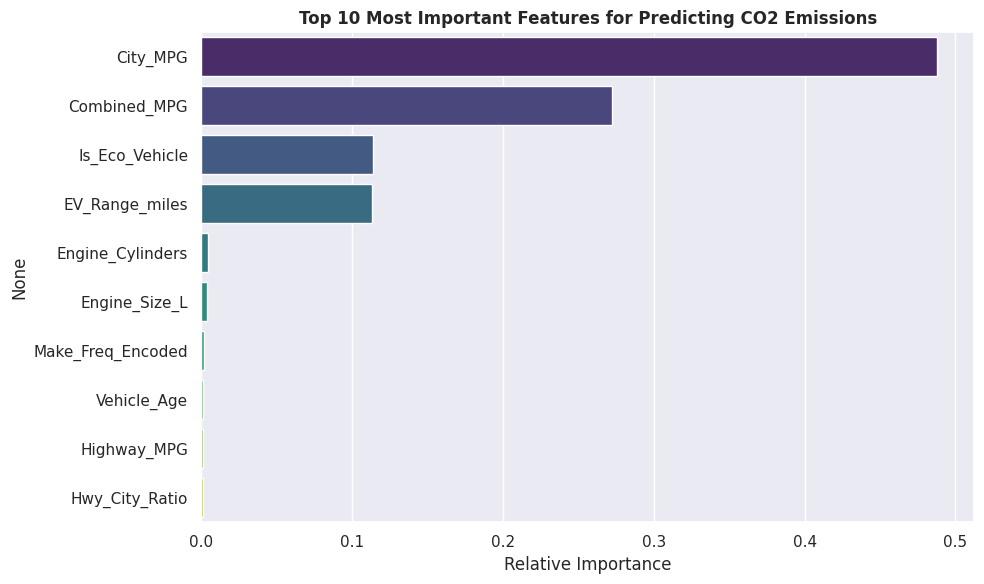

In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# --- 1. Prepare the Data ---
print("--- Preparing Data for Modeling ---")

# Define our target variable (y) and our features (X)
target_col = 'CO2_Emissions_g_per_mile'

# We drop the target variable, the original categorical columns we already encoded,
# and the binning column we made (since it's derived from our target)
cols_to_drop = [target_col, 'Emissions_Tier', 'Year']
X = df_engineered.drop(columns=cols_to_drop, errors='ignore')

# Ensure all remaining data is numeric (drop any lingering text columns for the model)
X = X.select_dtypes(include=[np.number])

# Handle any remaining missing values (filling with median for simplicity)
X = X.fillna(X.median())

y = df_engineered[target_col]

# Split the data: 80% for training, 20% for testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Training features shape: {X_train.shape}")
print(f"Testing features shape: {X_test.shape}")

# --- 2. Train Models ---
print("\n--- Training Models ---")

# Model A: Linear Regression
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
lr_preds = lr_model.predict(X_test)

# Model B: Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
rf_preds = rf_model.predict(X_test)

# --- 3. Evaluate Performance ---
print("\n--- Evaluation Metrics ---")

def evaluate_model(name, y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    print(f"** {name} **")
    print(f"  MAE (Mean Absolute Error): {mae:.2f} g/mile")
    print(f"  RMSE (Root Mean Squared Error): {rmse:.2f} g/mile")
    print(f"  R-squared: {r2:.4f}\n")

evaluate_model("Linear Regression", y_test, lr_preds)
evaluate_model("Random Forest", y_test, rf_preds)

# --- 4. Feature Importance (Random Forest) ---
print("--- Top 10 Feature Importances (Random Forest) ---")
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

# Plot the top 10 features
plt.figure(figsize=(10, 6))
plt.title("Top 10 Most Important Features for Predicting CO2 Emissions", fontweight='bold')
sns.barplot(x=importances[indices][:10], y=X.columns[indices][:10], palette='viridis')
plt.xlabel("Relative Importance")
plt.tight_layout()
plt.show()

# Thank You